 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 05 : Dynamic Time Warping (DTW)  </b>


We expect you to code the dynamic time warping algorithm from scratch in this programming assignment. The skeleton code is provided for you to understand the algorithm. At the end of the assignment, you need to write an algorithm to perform an isolated digit recognition task using Dynamic Time Warping (DTW) codes. Isolated digit recognition is the task of recognizing the digit from the test speech signal having a single digit in isolation.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








<h4> <b> Part (a). Dynamic Time Warping(DTW): </b>  In this part you need to try and implement the basic sequence matching algorithm DTW. </h4>
<dt> <h4> Two sequences A and B can be compared using a euclidean distance
<center> $ A = (x_1, x_2, x_3, ..., x_M)$ </center> <br>
<center> $ B = (y_1, y_2, y_3, ..., y_N)$ </center> <br> </h4> </dt>
<dt> <h4> Now the distance is computed as </h4> </dt>
<center> $ D(A,B) = \frac{1}{N} \sum_1^N || x_n - y_n||$</center> </h4> </dt>
<dt> <h4> There are two main issues </h4> </dt>
<dd> <h4> 1. What if the sequences are not aligned in time ?</h4> </dt>
<dd> <h4> 2. What if the sequences have varying lengths ?</h4> </dt>
<dt> <h4> The non-linear alignment path produces a better similarity measure. </h4> </dt>

![picture](https://drive.google.com/uc?export=view&id=1XWTK0XUpDIuf-5nbe7pk6uPx29-22zF0)

<dt> <h4> <b> Algorithm </b> </h4> </dt>
<dt> <h4>  1. Compute distance matrix $D_{M\times N}$ between A and B </h4> </dt>
<dt> <h4>  2. Compute accumulated distance matrix $C_{M\times N}$ between A and B </h4> </dt>
<dd> <h4>  ~ Initialize: C(0,0) = D(0,0) </h4> </dd>
<dd> <h4>  ~ for i=1,2,..M and j=1,2,...N  <dd> <h4>  ~ Update C <dd> <h4> C(i,j) = D(i,j) + min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> <dd> <h4>  ~ Store the best Path <dd> <h4> P(i,j) = arg min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> </h4> </dd>
<dt> <h4>  3. C(M,N) gives the similarity measure </h4> </dt>
<dt> <h4>  4. Backtrack the best alignment path <br> <center> $ q_T^* = (M,N) \\ q_{t-1}^* = P(q_t^*) \qquad t = T,T-1,....1$ </center></h4> </dt>
<dt> <h4> <b> Programming question </b> </h4> </dt>
<dt> <h4>  1. Consider the following two sequences $A = [4,3,7,0,2,6,5]$, and $B = [3,7,1,6,1,5,4,4]$. Write a DTW algorithm to find the optimal similarity/distance between them. </h4> </dt>
<dd> <h4> - Compute the distance matrix between the two sequences </dd> </h4>
<dd> <h4> - Compute the accumulative distance matrix </dd> </h4>
<dd> <h4> - Backtrack from the accumulative distance matrix to get the optimal path and thereby compute the optimal distance </dd> </h4>
<dd> <h4> - Plot the optimal path on both the distance matrix and cumulative distance matrix to verify the DTW codes </dd> </h4>



The path is:
 [[0, 0], [0, 1], [1, 2], [2, 3], [3, 4], [4, 4], [5, 5], [6, 6], [6, 7]]
The optimum distance for the given two sequences are: 20.0


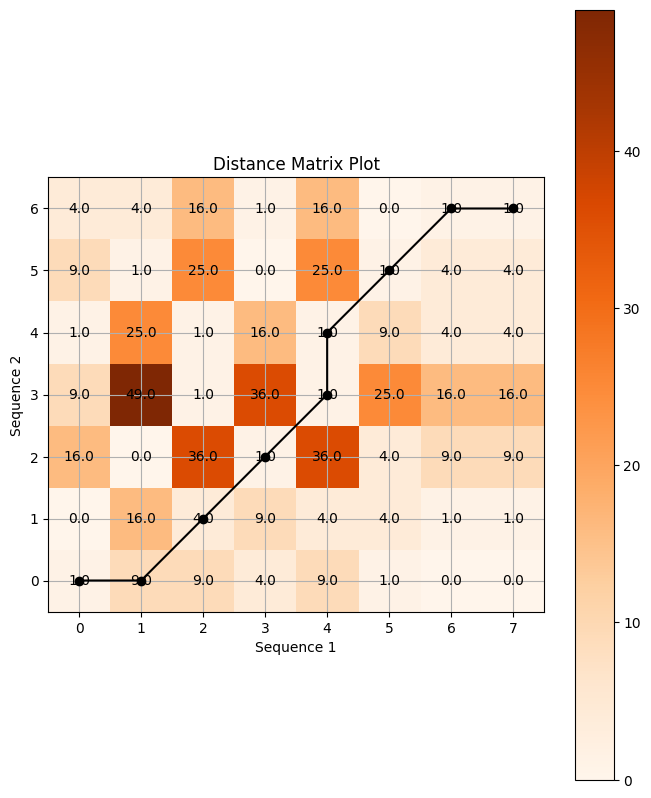

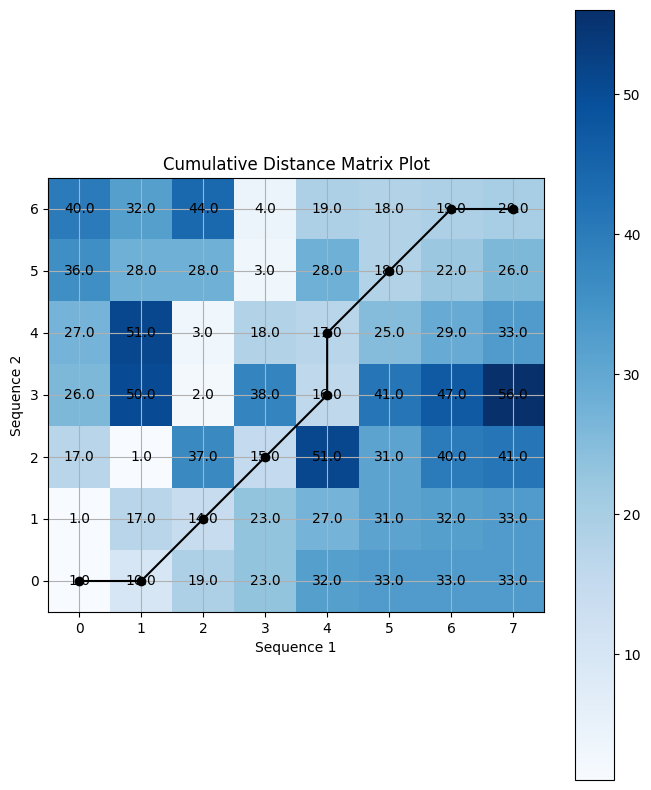

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two sequences
###########################################################
def DTW(sequence1,sequence2):
    #######################################################
    # Input  : Two sequences
    # Output : DTW path and optimal distance
    #######################################################

    M = len(sequence1)
    N = len(sequence2)

    Distance_matrix = np.zeros((M,N))
    for i in range(M):
        for j in range(N):
            Distance_matrix[i,j] = np.square(sequence1[i] - sequence2[j])

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################
    # Initialize the cumulative distance matrix

    DTW_cumulate_Matrix = np.zeros((M,N))   #Cummulative distance matrix
    DTW_cumulate_Matrix[0,0] = Distance_matrix[0,0]
    # print(DTW_cumulate_Matrix[0,1],'\n')
    path_matrix = np.zeros((M,N,2))
    path_matrix[0,0] = np.array([0,0])

    for i in range(1,M):
        DTW_cumulate_Matrix[i,0] = DTW_cumulate_Matrix[i-1,0] + Distance_matrix[i,0]
        path_matrix[i,0] = np.array([i-1,0])

    for j in range(1,N):
        DTW_cumulate_Matrix[0,j] = DTW_cumulate_Matrix[0,j-1] + Distance_matrix[0,j]
        path_matrix[0,j] = np.array([0,j-1])


    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1,M,1): #you can start from 1
        for j in range(1,N,1):
            current_distance = Distance_matrix[i,j]      #Compute the distance between the two points
            store_i = i-1
            store_j = j-1
            # print(i,j)
            minstep = DTW_cumulate_Matrix[i-1,j-1]

            #Add min(DTW_cumulate_Matrix[i-1,j],DTW_cumulate_Matrix[i-1,j-1],DTW_cumulate_Matrix[i,j-1]) to "current_distance" and assign it to "DTW_cumulate_Matrix[i,j]"

            if(DTW_cumulate_Matrix[i-1,j] < minstep):
                minstep = DTW_cumulate_Matrix[i-1,j]
                store_i = i-1
                store_j = j

            if(DTW_cumulate_Matrix[i,j-1] < minstep):
                minstep = DTW_cumulate_Matrix[i,j-1]
                store_i = i
                store_j = j-1

            DTW_cumulate_Matrix[i,j] = current_distance + minstep
            # print(store_i,store_j)
            path_matrix[i,j] = np.array([store_i,store_j])

    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################
    opt_distance = DTW_cumulate_Matrix[M-1,N-1]
    i = M-1
    j = N-1
    path = [[i,j]]
    # path = []
    while i!=0 or j!=0: #Start from the last point and backtrack
        # print(i,j)
        i, j = int(path_matrix[i, j, 0]), int(path_matrix[i, j, 1])
        path.append([i, j])#Store the required indexes to obtain the optimal path

    path.reverse()
    path = np.array(path)
    print('The path is:\n', path.tolist())
    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################

    return opt_distance, path, Distance_matrix, DTW_cumulate_Matrix



def plotDTWpath(sequence1,sequence2):
    #######################################################
    # Inputs : sequence1 and sequence2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################

    #Compute distance and cumulative distance between the given templates
    #Obtain the optimal path using "DTW" function
    optimum_distance,path,distances,dtw = DTW(sequence1, sequence2)

    M = len(sequence1)
    N = len(sequence2)

    print(f'The optimum distance for the given two sequences are: {optimum_distance}')


    #Plot the optimal path on distance and cumulative matrices and verify the DTW codes
    plt.figure(figsize=(8,10))
    plt.imshow(distances, interpolation='nearest', cmap='Oranges')
    plt.plot(path[:,1], path[:,0], 'ko-')
    plt.gca().invert_yaxis()
    plt.xlabel("Sequence 1")
    plt.ylabel("Sequence 2")
    for i in range(M):
        for j in range(N):
            plt.text(j, i, str(distances[i, j]), ha='center', va='center', color='black')
    plt.grid()
    plt.colorbar()
    plt.title('Distance Matrix Plot')
    plt.show()


    plt.figure(figsize=(8,10))
    plt.imshow(dtw, interpolation='nearest', cmap='Blues')
    plt.plot(path[:,1], path[:,0], 'ko-')
    plt.gca().invert_yaxis()
    plt.xlabel("Sequence 1")
    plt.ylabel("Sequence 2")
    for i in range(M):
        for j in range(N):
            plt.text(j, i, str(dtw[i, j]), ha='center', va='center', color='black')
    plt.grid()
    plt.colorbar()
    plt.title('Cumulative Distance Matrix Plot')
    plt.show()



x = np.array([4,3,7,0,2,6,5])
y = np.array([3,7,1,6,1,5,4,4])
plotDTWpath(x,y)


<b> Report your observations </b>

1. The DTW algorithm identifies an optimal alignment path between two sequences, indicating the correspondence between points in one sequence and points in the other.

2. The optimal path obtained in both the distance matrix and cumulative matrix is the same.

3. The DTW Algorithm follows a DP approach and not greedy approach on the distance matrix in order to reach with least possible distance, most optimal path.


<dt> <h4> <b> Part (b): </b> In this part of the assignment, we expect you to build the Isolated digit recognition system with the help of the above written DTW algorithm. </dt> </h4>

![picture](https://drive.google.com/uc?export=view&id=1nGtWwbDg8PJBNwck_dUt2mmsCBshrGYc)



<dt> <h4> 1. Record one repetition each of the digits zero, one, two, three, four, five, six, seven, eight, and nine. The modules to record the voice in online mode are provided here. If you are not comfortable using the online recording modules, you can record the digits offline and access them in google colab through proper codes. </dt> </h4>
<dt> <h4> 2. Record three further repetitions of the same digits (Isolated words) as test data. </dt> </h4>  
<dt> <h4> 3. The codes to compute the signal's templates (Mel Frequency Cepstral Coefficients) are provided. Please use them to obtain the templates of the speech signals. </dt> </h4>  
<dt> <h4> 4. Write an algorithm to perform isolated digit recognition with the help of the DTW codes. </dt> </h4>
<dt> <h4> 5. Take two pairs such that one pair is the repetition of the same digit and another one is two different digits. Plot the optimal DTW path on distance and cumulative distance matrices for both cases.   </dt> </h4>
<dt> <h4> 6. Evaluate the digit recognition accuracy, i.e., the percentage of correctly recognized trials out of each digit's total number of attempts. </dt> </h4>
<dt> <h4> 7. Create a confusion matrix and report the most confusing digits. </dt> </h4>


**Module to record the voice in online mode**

In [ ]:
from IPython.display import Javascript
from google.colab import output
from base64 import b64decode
from io import BytesIO
!pip -q install pydub
from pydub import AudioSegment

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.io.wavfile
import io
import os
from IPython.display import Audio
from google.colab import files

#### Please comment below line, if you already uploaded the 'recording.wav' in '/content/'
# !rm recording_training_0.wav
# !rm recording_training_1.wav
# !rm recording_training_2.wav
# !rm recording_training_3.wav
# !rm recording_training_4.wav
# !rm recording_training_5.wav
# !rm recording_training_6.wav
# !rm recording_training_7.wav
# !rm recording_training_8.wav
# !rm recording_training_9.wav

#### You can run this module in the loop to record more repetitions of the digits.
for i in range(10):
  if os.path.isfile('recording_training_'+ str(i)+ '.wav'):
      print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
  else:
      print("Recording the digits")
      wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
      wav = wav.set_frame_rate(16000)
      sig=wav.get_array_of_samples()
      samples=np.array(sig).T.astype(np.float32)
      fp_arr = np.array(samples).T.astype(np.float32)
      fp_arr /= np.iinfo(sig.typecode).max
      scipy.io.wavfile.write('recording_training_'+ str(i)+ '.wav', 16000, fp_arr) #Please change the name.
      # Save the file to Colab directory
      files.download('recording_training_'+ str(i)+ '.wav')

  wn = Audio('recording_training_'+ str(i)+ '.wav', autoplay=False)
  display(wn)

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy


tr_data = []
tr_label = range(10)
for i in range(10):
    wavfile = 'recording_training_'+ str(i)+ '.wav'
    (rate,sig) = wav.read(wavfile)
    sig=sig-np.mean(sig)
    mfcc_feat=mfcc(sig,rate,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    mfcc_feat_cmvn=speechpy.processing.cmvnw(mfcc_feat,win_size=301,variance_normalization=False)
    tr_data.append(mfcc_feat_cmvn)

  Preparing metadata (setup.py) ... done


In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.io.wavfile
import io
import os
from IPython.display import Audio

#### Please comment below line, if you already uploaded the 'recording.wav' in '/content/'
# !rm recording_testing1_0.wav
# !rm recording_testing2_0.wav
# !rm recording_testing3_0.wav


#### You can run this module in the loop to record more repetitions of the digits.
te_label = []
for j in range(10):
    for i in range(3):
        if os.path.isfile('recording_testing' + str(i)+'_'+ str(j)+ '.wav'):
            print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
        else:
            print(f"Recording the digits Testing {i} Digit {j}")
            wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
            wav = wav.set_frame_rate(16000)
            sig=wav.get_array_of_samples()
            samples=np.array(sig).T.astype(np.float32)
            fp_arr = np.array(samples).T.astype(np.float32)
            fp_arr /= np.iinfo(sig.typecode).max
            scipy.io.wavfile.write('recording_testing' + str(i)+'_'+ str(j)+ '.wav', 16000, fp_arr) #Please change the name.
            te_label.append(j)
        wn = Audio('recording_testing' + str(i)+'_'+ str(j)+ '.wav', autoplay=False)
        display(wn)

Recording the digits Testing 0 Digit 0


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 0


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 0


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 1


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 1


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 1


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 2


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 2


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 2


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 3


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 3


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 3


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 4


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 4


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 4


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 5


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 5


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 5


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 6


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 6


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 6


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 7


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 7


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 7


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 8


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 8


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 8


<IPython.core.display.Javascript object>

Recording the digits Testing 0 Digit 9


<IPython.core.display.Javascript object>

Recording the digits Testing 1 Digit 9


<IPython.core.display.Javascript object>

Recording the digits Testing 2 Digit 9


<IPython.core.display.Javascript object>

In [ ]:
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy


te_data = []
for j in range(10):
    for i in range(3):
        wavfile = 'recording_testing' + str(i)+'_'+ str(j)+ '.wav'
        (rate,sig) = wav.read(wavfile)
        sig=sig-np.mean(sig)
        mfcc_feat=mfcc(sig,rate,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
        mfcc_feat_cmvn=speechpy.processing.cmvnw(mfcc_feat,win_size=301,variance_normalization=False)
        te_data.append(mfcc_feat_cmvn)

In [ ]:
tr_label = list(tr_label)

In [ ]:
'''
Optional Code, please uncomment and run the
code to access the self recorded training and
testing wav files.
This is the drive link for the below code:
https://drive.google.com/drive/folders/1yS4caC-dRT8KGY1rXeziVwEvnfPVOu9Y?usp=sharing
'''

# #All imports
# from google.colab import drive
# drive.mount('/content/drive')

# import os
# import numpy as np
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt
# import collections
# import scipy.io.wavfile as wav
# !pip -q install python_speech_features
# !pip -q install speechpy
# from python_speech_features import mfcc
# import speechpy

# def wav_to_mfcc(wavfile):
#     (rate, sig) = wav.read(wavfile)
#     sig = sig - np.mean(sig)
#     mfcc_feat = mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
#     mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
#     return mfcc_feat_cmvn

# tr_data = []
# tr_label = []
# te_data = []
# te_label = []

# data_dir = '/content/drive/My Drive/PRML_Assignments/Assignment_5/training_recording'
# for wavfile in os.listdir(data_dir):
#     parts = wavfile.split('_')
#     digit = int(parts[2].split('.')[0])
#     mfcc_features = wav_to_mfcc(os.path.join(data_dir, wavfile))
#     tr_data.append(mfcc_features)
#     tr_label.append(digit)

# data_dir = '/content/drive/My Drive/PRML_Assignments/Assignment_5/testing_recording'
# for wavfile in os.listdir(data_dir):
#     parts = wavfile.split('_')
#     digit = int(parts[2].split('.')[0])
#     mfcc_features = wav_to_mfcc(os.path.join(data_dir, wavfile))
#     te_data.append(mfcc_features)
#     te_label.append(digit)

Mounted at /content/drive
  Preparing metadata (setup.py) ... done



**Algorithm to perform isolated digit recognition**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two templates
###########################################################
def vectorDTW(template1,template2):
    #######################################################
    # Input  : Two templates
    # Output : DTW path and optimal distance
    #######################################################

    M, D = template1.shape
    N, D = template2.shape

    Distance_matrix = np.zeros((M,N))
    for i in range(M):
        for j in range(N):
            Distance_matrix[i,j] = np.sum((template1[i] - template2[j])**2)

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################
    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.zeros((M,N))   #Cummulative distance matrix
    DTW_cumulate_Matrix[0,0] = Distance_matrix[0,0]
    # print(DTW_cumulate_Matrix[0,1],'\n')
    path_matrix = np.zeros((M,N,2))
    path_matrix[0,0] = np.array([0,0])

    for i in range(1,M):
        DTW_cumulate_Matrix[i,0] = DTW_cumulate_Matrix[i-1,0] + Distance_matrix[i,0]
        path_matrix[i,0] = np.array([i-1,0])

    for j in range(1,N):
        DTW_cumulate_Matrix[0,j] = DTW_cumulate_Matrix[0,j-1] + Distance_matrix[0,j]
        path_matrix[0,j] = np.array([0,j-1])


    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1,M,1): #you can start from 1
        for j in range(1,N,1):
            current_distance = Distance_matrix[i,j]      #Compute the distance between the two points
            store_i = i-1
            store_j = j-1
            # print(i,j)
            minstep = DTW_cumulate_Matrix[i-1,j-1]

            #Add min(DTW_cumulate_Matrix[i-1,j],DTW_cumulate_Matrix[i-1,j-1],DTW_cumulate_Matrix[i,j-1]) to "current_distance" and assign it to "DTW_cumulate_Matrix[i,j]"

            if(DTW_cumulate_Matrix[i-1,j] < minstep):
                minstep = DTW_cumulate_Matrix[i-1,j]
                store_i = i-1
                store_j = j

            if(DTW_cumulate_Matrix[i,j-1] < minstep):
                minstep = DTW_cumulate_Matrix[i,j-1]
                store_i = i
                store_j = j-1

            DTW_cumulate_Matrix[i,j] = current_distance + minstep
            # print(store_i,store_j)
            path_matrix[i,j] = np.array([store_i,store_j])

    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################
    opt_distance = DTW_cumulate_Matrix[M-1,N-1]
    i = M-1 # length of the template1
    j = N-1 # length of the template2
    path = [[i,j]]
    while i!=0 or j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        #You may use "np.argmin for Eucludian (or np.argmax for cosine) " function for doing it
        i, j = int(path_matrix[i, j, 0]), int(path_matrix[i, j, 1])

        # # Add the current indexes distance
        # opt_distance = opt_distance +    # Compute the euclidean distance  of feature vectors  Template1[i] and Template2[j]

        #Store the required indexes to obtain the optimal path
        path.append([i, j])#Store the required indexes to obtain the optimal path

    # print('The distance matrix\n', Distance_matrix)
    # print('The cumulative distance matrix\n', DTW_cumulate_Matrix)
    path.reverse()
    path = np.array(path)
    # print('The path is:\n', path.tolist())

    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################

    return opt_distance, path, Distance_matrix, DTW_cumulate_Matrix



def plotDTWpath(template1,template2):
    #######################################################
    # Inputs : template1 and template2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################

    #Compute distance and cumulative distance between the given templates
    #Obtain the optimal path using "DTW" function

    optimum_distance,path,distances,dtw = vectorDTW(template1, template2)

    M = len(template1)
    N = len(template2)

    print(f'The optimum distance for sequences are: {optimum_distance}')

    #Plot the optimal path on distance and cumulative matrices and verify the DTW codes
    plt.figure(figsize=(8,10))
    plt.imshow(distances, interpolation='nearest', cmap='Oranges')
    plt.plot(path[:,1], path[:,0], 'ko-')
    plt.gca().invert_yaxis()
    plt.xlabel("Sequence 1")
    plt.ylabel("Sequence 2")
    plt.grid()
    plt.colorbar()
    plt.title('Distance Matrix Plot')
    plt.show()

    plt.figure(figsize=(8,10))
    plt.imshow(dtw, interpolation='nearest', cmap='Blues')
    plt.plot(path[:,1], path[:,0], 'ko-')
    plt.gca().invert_yaxis()
    plt.xlabel("Sequence 1")
    plt.ylabel("Sequence 2")
    plt.grid()
    plt.colorbar()
    plt.title('Cumulative Distance Matrix Plot')
    plt.show()



**Plot the optimal DTW path**

Reference Digit: 4, Testing Digit: 4
The optimum distance for sequences are: 1195799.0859069824


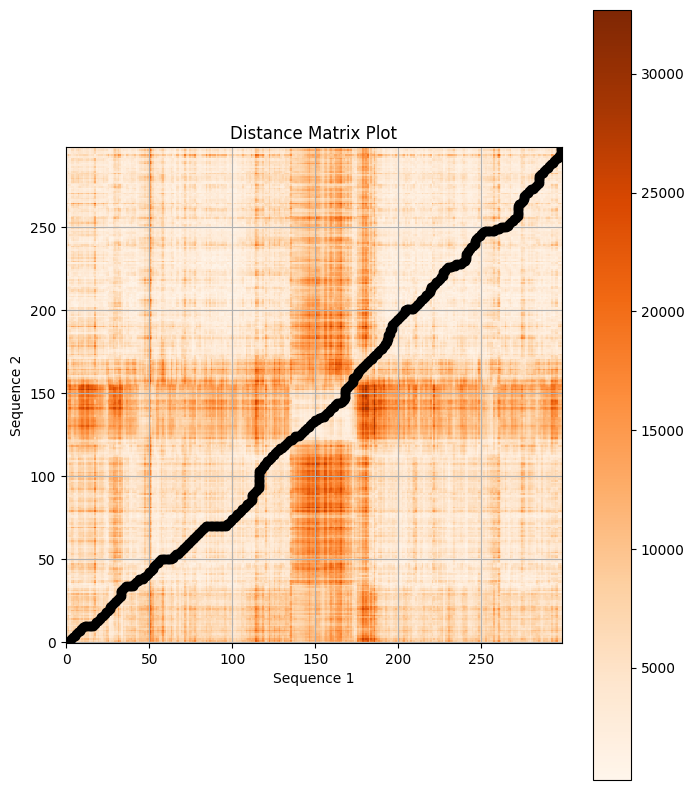

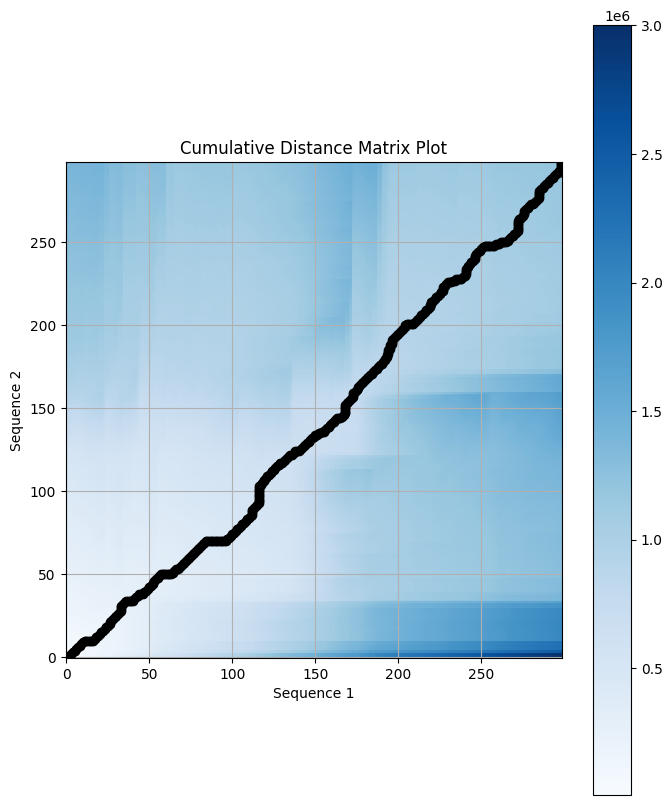

Reference Digit: 7, Testing Digit: 1
The optimum distance for sequences are: 1366211.2524414062


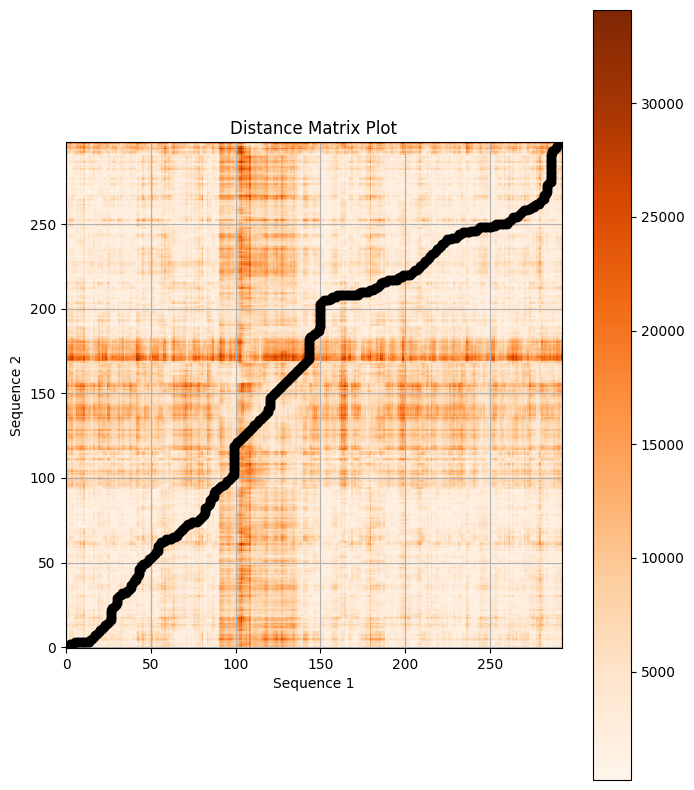

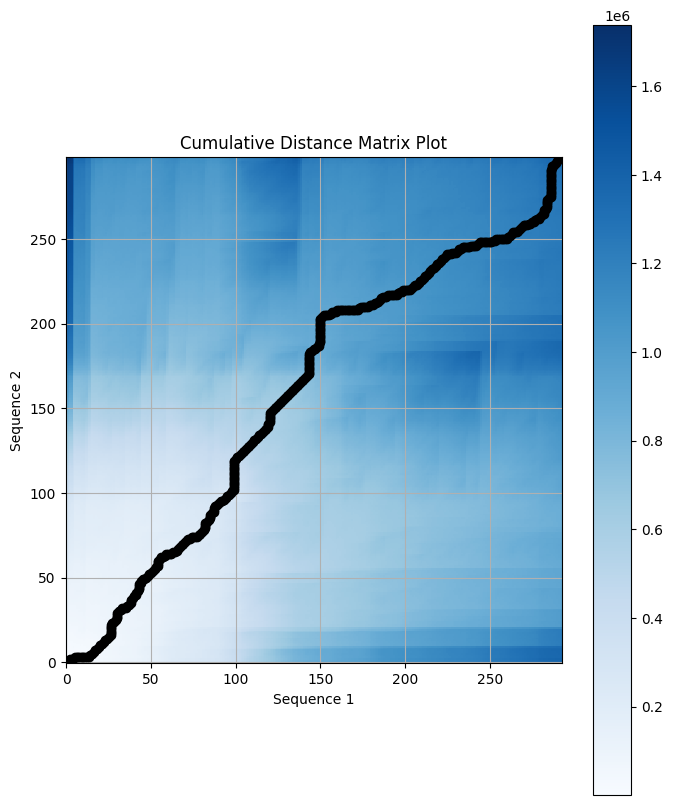

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

te_pred = -np.ones((30,))

for i in range(30):
    min_op_dist = np.inf
    pred = -1
    test_template = te_data[i]
    for n in range(10):
        tr_template = tr_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = tr_label[n]
    te_pred[i] = pred

# Plot same Digit Matrixes and DTW Path
print(f'Reference Digit: {tr_label[3]}, Testing Digit: {te_label[4]}')
plotDTWpath(tr_data[3],te_data[4])

# Plot different Digit Matrixes and DTW Path
print(f'Reference Digit: {tr_label[1]}, Testing Digit: {te_label[2]}')
plotDTWpath(tr_data[1],te_data[2])


**Compute the required metrics ( digit recognition accuracy ) and illustrations ( confusion matrix )**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

def Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy
    #Compute the accuracy
    accuracy = np.count_nonzero((Y_test - Y_pred)==0)/Y_pred.shape[0]
    #Return the accuracy
    return accuracy

def compute_confusion_matrix(true, pred):
    '''
    Inputs: Ground truth labels and classifier predictions
    Outputs: Confusion matrix
    '''
    confusion_matrix = np.zeros((10, 10), dtype=int)
    for i in range(len(true)):
        confusion_matrix[int(true[i])][int(pred[i])] += 1

    return confusion_matrix

Accuracy = Accuracy(te_label, te_pred)
confusion_matrix = compute_confusion_matrix(te_label, te_pred)

print(f'The Digit Recongnition Accuracy is: {Accuracy*100}%\n')
print(f'The confusion matrix is:\n{confusion_matrix}')

The Digit Recongnition Accuracy is: 60.0%

The confusion matrix is:
[[3 0 0 0 0 0 0 0 0 0]
 [0 3 0 0 0 0 0 0 0 0]
 [1 0 2 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 2 0 0 0]
 [0 3 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 3 0 0 0 0]
 [0 0 0 0 0 0 3 0 0 0]
 [0 1 0 0 0 2 0 0 0 0]
 [0 0 1 0 0 0 0 0 2 0]
 [0 1 0 0 0 0 0 0 0 2]]


<b> Report your observations </b>

1. The DTW algorithm identifies an optimal alignment path between two sequences, indicating the correspondence between points in one sequence and points in the other.

2. The optimal path obtained in both the distance matrix and cumulative matrix is the same.

3. The Vector DTW algorithm gives low accuracy (60%) as the training and testing data were quite noisy due to the microphone quality, background noise, and my broken voice. Also while recording the test digits, I used slightly different pronounciations for the same digit (especially digit 7) to account for variability. This is also the reason why the digit 7 is one of the most confusing digits.

4. According to the confusing matrix (checking the value of diagonal elements), the most confusing digits are 3,4,7 as the Diagonal entries at those indices are zero.


<dt> <h4> <b> Part (c): </b> In this part of the assignment, we expect you to evaluate the above-written digit recognition system performance on different test cases and understand the pros and cons of the DTW algorithm.  </dt> </h4>

[link to TDIGITS data](https://drive.google.com/drive/folders/1oV3jrUiug0-SwWLOdLtbXA6hzqYYIlI7?usp=sharing)


<dt> <h4> 1. Evaluate the performance of digit recognition systems on the TDGIT database shared with you and report the accuracy. </dt> </h4>
<dt> <h4> 2. Evaluate the performance in different cases, i.e., a pair of templates with the same speaker and a different speaker. </dt> </h4>
<dt> <h4> 3. Please report some of the changes to improve the system performance. </dt> </h4>

In [ ]:
'''
Drive Link for the below code: https://drive.google.com/drive/folders/1zcsj9UWaTkkJbyzaFC638Wd55Nj7k96a?usp=sharing
'''

#All imports
from google.colab import drive
drive.mount('/content/drive')

import os
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy

# Define paths
data_dir = '/content/drive/My Drive/MultiSpeakerDigitData_modified'

# Function to convert WAV file to MFCC features
def wav_to_mfcc(wavfile):
    (rate, sig) = wav.read(wavfile)
    sig = sig - np.mean(sig)
    mfcc_feat = mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
    mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
    return mfcc_feat_cmvn

# Iterate through each person's folder

jackson_training_data = []
nicolas_training_data = []
theo_training_data = []
yweweler_training_data = []

jackson_training_targets = []
nicolas_training_targets = []
theo_training_targets = []
yweweler_training_targets = []

jackson_testing_data = []
nicolas_testing_data = []
theo_testing_data = []
yweweler_testing_data = []

jackson_testing_targets = []
nicolas_testing_targets = []
theo_testing_targets = []
yweweler_testing_targets = []

for person_folder in os.listdir(data_dir):
    person_dir = os.path.join(data_dir, person_folder)

    # Initialize lists to store training and testing data
    train_data = []
    train_targets = []
    test_data = []
    test_targets = []

    # Iterate through WAV files in the person's folder
    for wavfile in os.listdir(person_dir):
        # Extract digit and serial number from file name
        parts = wavfile.split('_')
        digit = parts[0]
        serial_number = int(parts[2].split('.')[0])

        # Convert WAV file to MFCC features
        mfcc_features = wav_to_mfcc(os.path.join(person_dir, wavfile))

        # Decide whether to add to training or testing data
        if serial_number == 10:
            train_data.append(mfcc_features)
            train_targets.append(int(digit))
        else:
            test_data.append(mfcc_features)
            test_targets.append(int(digit))

    if(parts[1] == 'jackson'):
        jackson_training_data = train_data
        jackson_training_targets = train_targets
        jackson_testing_data = test_data
        jackson_testing_targets = test_targets
    elif(parts[1] == 'nicolas'):
        nicolas_training_data = train_data
        nicolas_training_targets = train_targets
        nicolas_testing_data = test_data
        nicolas_testing_targets = test_targets
    elif(parts[1] == 'theo'):
        theo_training_data = train_data
        theo_training_targets = train_targets
        theo_testing_data = test_data
        theo_testing_targets = test_targets
    elif(parts[1] == 'yweweler'):
        yweweler_training_data = train_data
        yweweler_training_targets = train_targets
        yweweler_testing_data = test_data
        yweweler_testing_targets = test_targets


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

def Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy
    #Compute the accuracy
    accuracy = np.count_nonzero((Y_test - Y_pred)==0)/Y_pred.shape[0]
    #Return the accuracy
    return accuracy

N_te = len(theo_testing_targets)

##################################################################################################
# Performance evaluation of Isolated digit recognition system on TDIGITS data
##################################################################################################

# Performance evaluation of Isolated digit recognition system on TDIGITS data, with the reference and test signal coming from the same speaker
# for Theo:
theo_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = theo_testing_data[i]
    for n in range(10):
        tr_template = theo_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = theo_training_targets[n]
    theo_te_pred[i] = pred
Acc_theo = Accuracy(theo_testing_targets, theo_te_pred)

# for Nicolas:
nicolas_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = nicolas_testing_data[i]
    for n in range(10):
        tr_template = nicolas_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = nicolas_training_targets[n]
    nicolas_te_pred[i] = pred
Acc_nicolas = Accuracy(nicolas_testing_targets, nicolas_te_pred)

# for Jackson:
jackson_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = jackson_testing_data[i]
    for n in range(10):
        tr_template = jackson_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = jackson_training_targets[n]
    jackson_te_pred[i] = pred
Acc_jackson = Accuracy(jackson_testing_targets, jackson_te_pred)

# for Yweweler:
yweweler_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = yweweler_testing_data[i]
    for n in range(10):
        tr_template = yweweler_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = yweweler_training_targets[n]
    yweweler_te_pred[i] = pred
Acc_yweweler = Accuracy(yweweler_testing_targets, yweweler_te_pred)

print("The Accuracies when the reference and the test signal are from same speaker:\n")
print("For Theo: ", Acc_theo*100, '%')
print("For Yweweler: ", Acc_yweweler*100, '%')
print("For Jackson: ", Acc_jackson*100, '%')
print("For Nicolas: ", Acc_nicolas*100, '%')

# Performance evaluation of Isolated digit recognition system on TDIGITS data, with the reference and test signal coming from different speakers

# The format for naming the variables: (Testing - Reference  or Testing_Reference)
# for Theo - Nicolas:
theo_nicolas_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = theo_testing_data[i]
    for n in range(10):
        tr_template = nicolas_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = nicolas_training_targets[n]
    theo_nicolas_te_pred[i] = pred
Acc_theo_nicolas = Accuracy(theo_testing_targets, theo_nicolas_te_pred)

# for Theo - Jackson:
theo_jackson_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = theo_testing_data[i]
    for n in range(10):
        tr_template = jackson_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = jackson_training_targets[n]
    theo_jackson_te_pred[i] = pred
Acc_theo_jackson = Accuracy(theo_testing_targets, theo_jackson_te_pred)

# for Theo - Yweweler:
theo_yweweler_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = theo_testing_data[i]
    for n in range(10):
        tr_template = yweweler_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = yweweler_training_targets[n]
    theo_yweweler_te_pred[i] = pred
Acc_theo_yweweler = Accuracy(theo_testing_targets, theo_yweweler_te_pred)


# for Jackson - Yweweler:
jackson_yweweler_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = jackson_testing_data[i]
    for n in range(10):
        tr_template = yweweler_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = yweweler_training_targets[n]
    jackson_yweweler_te_pred[i] = pred
Acc_jackson_yweweler = Accuracy(jackson_testing_targets, jackson_yweweler_te_pred)

# for Jackson - Theo:
jackson_theo_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = jackson_testing_data[i]
    for n in range(10):
        tr_template = theo_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = theo_training_targets[n]
    jackson_theo_te_pred[i] = pred
Acc_jackson_theo = Accuracy(jackson_testing_targets, jackson_theo_te_pred)

# for Jackson - Nicolas:
jackson_nicolas_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = jackson_testing_data[i]
    for n in range(10):
        tr_template = nicolas_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = nicolas_training_targets[n]
    jackson_nicolas_te_pred[i] = pred
Acc_jackson_nicolas = Accuracy(jackson_testing_targets, jackson_nicolas_te_pred)


# for Yweweler - Nicolas:
yweweler_nicolas_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = yweweler_testing_data[i]
    for n in range(10):
        tr_template = nicolas_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = nicolas_training_targets[n]
    yweweler_nicolas_te_pred[i] = pred
Acc_yweweler_nicolas = Accuracy(yweweler_testing_targets, yweweler_nicolas_te_pred)

# for Yweweler - Theo:
yweweler_theo_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = yweweler_testing_data[i]
    for n in range(10):
        tr_template = theo_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = theo_training_targets[n]
    yweweler_theo_te_pred[i] = pred
Acc_yweweler_theo = Accuracy(yweweler_testing_targets, yweweler_theo_te_pred)

# for Yweweler - Theo:
yweweler_jackson_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = yweweler_testing_data[i]
    for n in range(10):
        tr_template = jackson_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = jackson_training_targets[n]
    yweweler_jackson_te_pred[i] = pred
Acc_yweweler_jackson = Accuracy(yweweler_testing_targets, yweweler_jackson_te_pred)


# for Nicolas - Jackson:
nicolas_jackson_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = nicolas_testing_data[i]
    for n in range(10):
        tr_template = jackson_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = jackson_training_targets[n]
    nicolas_jackson_te_pred[i] = pred
Acc_nicolas_jackson = Accuracy(nicolas_testing_targets, nicolas_jackson_te_pred)

# for Nicolas - Theo:
nicolas_theo_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = nicolas_testing_data[i]
    for n in range(10):
        tr_template = theo_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = theo_training_targets[n]
    nicolas_theo_te_pred[i] = pred
Acc_nicolas_theo = Accuracy(nicolas_testing_targets, nicolas_theo_te_pred)

# for Nicolas - Yweweler:
nicolas_yweweler_te_pred = -np.ones((N_te,))
for i in range(N_te):
    min_op_dist = np.inf
    pred = -1
    test_template = nicolas_testing_data[i]
    for n in range(10):
        tr_template = yweweler_training_data[n]
        op_dist,_,_,_ = vectorDTW(tr_template,test_template)
        if(op_dist < min_op_dist):
            min_op_dist = op_dist
            pred = yweweler_training_targets[n]
    nicolas_yweweler_te_pred[i] = pred
Acc_nicolas_yweweler = Accuracy(nicolas_testing_targets, nicolas_yweweler_te_pred)


# printing the accuracies:
print("\n\nThe Accuracies when the reference and the test signal are from different speakers:")

print("Taking Theo as Testing Signal:")
print("For Theo(Testing) - Nicolas(Referencing): ", Acc_theo_nicolas*100, '%')
print("For Theo(Testing) - Jackson(Referencing): ", Acc_theo_jackson*100, '%')
print("For Theo(Testing) - Yweweler(Referencing): ", Acc_theo_yweweler*100, '%\n')

print("Taking Jackson as Testing Signal:")
print("For Jackson(Testing) - Yweweler(Referencing): ", Acc_jackson_yweweler*100, '%')
print("For Jackson(Testing) - Theo(Referencing): ", Acc_jackson_theo*100, '%')
print("For Jackson(Testing) - Nicolas(Referencing): ", Acc_jackson_nicolas*100, '%\n')

print("Taking Yweweler as Testing Signal:")
print("For Yweweler(Testing) - Nicolas(Referencing): ", Acc_yweweler_nicolas*100, '%')
print("For Yweweler(Testing) - Theo(Referencing): ", Acc_yweweler_theo*100, '%')
print("For Yweweler(Testing) - Jackson(Referencing): ", Acc_yweweler_jackson*100, '%\n')

print("Taking Nicolas as Testing Signal:")
print("For Nicolas(Testing) - Theo(Referencing): ", Acc_nicolas_theo*100, '%')
print("For Nicolas(Testing) - Jackson(Referencing): ", Acc_nicolas_jackson*100, '%')
print("For Nicolas(Testing) - Yweweler(Referencing): ", Acc_nicolas_yweweler*100, '%\n')

# Suggest some of the changes to improve the system performance.
### Written in markdown below...


The Accuracies when the reference and the test signal are from same speaker:

For Theo:  94.28571428571428 %
For Yweweler:  87.95918367346938 %
For Jackson:  86.73469387755102 %
For Nicolas:  81.83673469387756 %


The Accuracies when the reference and the test signal are from different speakers:
Taking Theo as Testing Signal:
For Theo(Testing) - Nicolas(Referencing):  45.30612244897959 %
For Theo(Testing) - Jackson(Referencing):  37.3469387755102 %
For Theo(Testing) - Yweweler(Referencing):  46.93877551020408 %

Taking Jackson as Testing Signal:
For Jackson(Testing) - Yweweler(Referencing):  41.0204081632653 %
For Jackson(Testing) - Theo(Referencing):  73.67346938775509 %
For Jackson(Testing) - Nicolas(Referencing):  37.55102040816327 %

Taking Yweweler as Testing Signal:
For Yweweler(Testing) - Nicolas(Referencing):  43.26530612244898 %
For Yweweler(Testing) - Theo(Referencing):  48.57142857142857 %
For Yweweler(Testing) - Jackson(Referencing):  12.448979591836734 %

Taking Nicolas as

### **Suggest some of the changes to improve the system performance.**

1. **Feature Engineering:**
- Explore different feature extraction techniques apart from MFCC, such as Mel-scaled spectrograms or deep learning-based feature extraction methods like Convolutional Neural Networks (CNNs).
- Experiment with different parameters for feature extraction, such as the number of MFCC coefficients, window length, and overlap.

2. **Model Optimization:**
- Using more advanced classification algorithms like Support Vector Machines (SVM), Random Forests, or deep learning architectures like Recurrent Neural Networks (RNNs) or Convolutional Neural Networks (CNNs).
- Tuning the hyperparameter for DTW algorithm, such as the choice of distance metric (Euclidean, Cosine), and windowing techniques can improve performance.

3. **Data Augmentation:**
- Augment the training data by introducing variations like pitch shifting, time stretching, adding noise, or simulating different recording environments. This can help in making the model more robust to variations in speech signals.

4. **Speaker Normalization:**
- Implement speaker normalization techniques to reduce variability introduced by different speakers. This could involve methods like z-score normalization or cepstral mean normalization (CMN) applied to the feature vectors.

5. **Sequence Alignment:**
- Using more sophisticated sequence alignment algorithms beyond DTW, such as Hidden Markov Models (HMMs).


<b> Report your observations </b>

1. The recognition system's accuracy significantly improves when both the reference and test signals originate from the same speaker, as opposed to situations where they are from different speakers. This implies that the system excels at recognizing speech patterns and traits specific to individual speakers, rather than accommodating variations introduced by multiple speakers, possibly due to the fact that wave signal will have same frequency, pitch and quality when taken from the same speaker.

2. For same speaker, there is generally less variation in speech patterns and acoustic features. This decreased variability simplifies the alignment process, resulting in higher digit recognition accuracy.

3. Recognition models trained on data from a particular speaker often demonstrate better generalization to test signals from the same speaker. This is because these models have already captured the unique voice characteristics and speaking style of that speaker during the training phase.

4. Across different speakers, the variability in speech patterns and the voice is higher, apart from variations in background noise, recording conditions, and microphone attributes. This variability can negatively impact recognition accuracy by introducing additional sources of distortion and mismatch.

5. Recognition models trained on data from one speaker may encounter challenges in effectively generalizing to test signals from other speakers. Such models may lack exposure to the diverse voice characteristics and speaking styles of different speakers during the training process, leading to low digit recognition accuracy.

